# Khai báo thư viện


In [ ]:
import numpy as np
import pandas as pd
import os
import random
import shutil
import glob
import yaml
import torch
import matplotlib.pyplot as plt
import xml.etree.ElementTree as ET
import cv2
from google.colab.patches import cv2_imshow

from PIL import Image
from matplotlib import pyplot as plt
from matplotlib import patches
from pathlib import Path
from sklearn.model_selection import train_test_split

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Install YOLOv8

In [ ]:
!pip install ultralytics

import ultralytics
from ultralytics import YOLO
ultralytics.checks()

Ultralytics YOLOv8.0.117 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 23.3/78.2 GB disk)


# Data Preprocessing

In [ ]:
directory = "/content/drive/MyDrive/CS331/Final_project/Dataset"
image_directory = directory + "/images"
annotation_directory = directory + "/annotations"
annotations = list(Path(annotation_directory).glob(r'**/*{}'.format('xml')))

In [ ]:
class_id = {
    "with_mask" : 0,
    "mask_weared_incorrect" : 1,
    "without_mask" : 2
}

data_dict = {
    'filename': [],
    'label': [],
    'class_id': [],
    'width': [],
    'height': [],
    'bboxes': []
}
for annotation_path in annotations:
    tree = ET.parse(annotation_path)
    root = tree.getroot()
    filename = root.find('filename').text
    for obj in root.findall("object"):
        label = obj.find("name").text

        bbox = []
        # bndbox has xmin, ymin, xmax, ymax
        bndbox_tree = obj.find('bndbox')
        bbox.append(int(bndbox_tree.find('xmin').text))
        bbox.append(int(bndbox_tree.find('ymin').text))
        bbox.append(int(bndbox_tree.find('xmax').text))
        bbox.append(int(bndbox_tree.find('ymax').text))
        size = root.find('size')

        data_dict['filename'].append(filename)
        data_dict['width'].append(int(size.find('width').text))
        data_dict['height'].append(int(size.find('height').text))
        data_dict['label'].append(label)
        data_dict['class_id'].append(class_id[label])
        data_dict['bboxes'].append(bbox)

df_data = pd.DataFrame(data_dict)

df_data.head()

,filename,label,class_id,width,height,bboxes
0,maksssksksss109.png,with_mask,0,400,400,"[216, 92, 372, 251]"
1,maksssksksss108.png,with_mask,0,400,225,"[155, 29, 180, 51]"
2,maksssksksss108.png,with_mask,0,400,225,"[206, 35, 228, 58]"
3,maksssksksss108.png,with_mask,0,400,225,"[332, 67, 346, 81]"
4,maksssksksss108.png,with_mask,0,400,225,"[362, 68, 376, 82]"


In [ ]:
df_data.isna().sum()

filename    0
label       0
class_id    0
width       0
height      0
bboxes      0
dtype: int64

In [ ]:
df_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4072 entries, 0 to 4071
Data columns (total 6 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   filename  4072 non-null   object
 1   label     4072 non-null   object
 2   class_id  4072 non-null   int64 
 3   width     4072 non-null   int64 
 4   height    4072 non-null   int64 
 5   bboxes    4072 non-null   object
dtypes: int64(3), object(3)
memory usage: 191.0+ KB


In [ ]:
df_data.label.unique()

array(['with_mask', 'without_mask', 'mask_weared_incorrect'], dtype=object)

In [ ]:
print(f"Total 'without_mask' labels: {sum(df_data.label == 'without_mask')}")
print(f"Total 'mask_weared_incorrect' labels: {sum(df_data.label == 'mask_weared_incorrect')}")
print(f"Total 'with_mask' labels: {sum(df_data.label == 'with_mask')}")

Total 'without_mask' labels: 717
Total 'mask_weared_incorrect' labels: 123
Total 'with_mask' labels: 3232


# Visualize Data

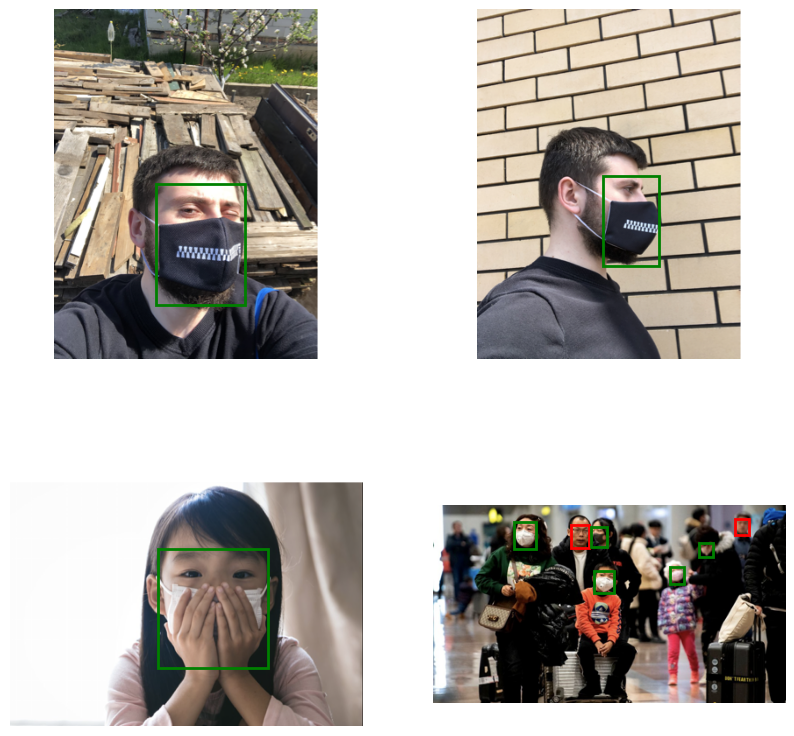

In [ ]:
def show_random_images_with_bbox(df):
    all_images = os.listdir(image_directory)
    random_image_filename = random.sample(all_images, 4)
    fig, ax = plt.subplots(nrows=2, ncols=2, figsize=(10, 10))
    for i, filename in enumerate(random_image_filename):
        selected_df = df[df['filename'] == filename]

        image = Image.open(image_directory + '/' + filename)

        ax.flat[i].imshow(image)
        ax.flat[i].axis(False)

        image_bboxes = []
        for df_index in range(0, len(selected_df)):
            color = "g"
            if selected_df.iloc[df_index].class_id == 1: color = "y"
            elif selected_df.iloc[df_index].class_id == 2: color = "r"

            x_min, y_min, x_max, y_max = selected_df.iloc[df_index].bboxes

            rect = patches.Rectangle([x_min, y_min], x_max-x_min, y_max-y_min,
                             linewidth=2, edgecolor=color, facecolor="none")
            ax.flat[i].add_patch(rect)

show_random_images_with_bbox(df_data)

# Convert bounding box format

In [ ]:
# we need to convert our bbox format to yolo as the current one that we have is on pascal_voc
def pascal_voc_to_yolo_bbox(bbox_array, w, h):
    x_min, y_min, x_max, y_max = bbox_array

    x_center = ((x_max + x_min) / 2) / w
    y_center = ((y_max + y_min) / 2) / h

    width = (x_max - x_min) / w
    height = (y_max - y_min) / h

    return [x_center, y_center, width, height]

# Split Train, Val, Test images

Create our directory to place our images

In [ ]:
train_path = "/content/drive/MyDrive/CS331/Final_project/yolov8x/train"
valid_path = "/content/drive/MyDrive/CS331/Final_project/yolov8x/valid"
test_path = "/content/drive/MyDrive/CS331/Final_project/yolov8x/test"

# os.mkdir("/content/drive/MyDrive/CS331/Final_project/yolov8x")
os.mkdir(train_path)
os.mkdir(valid_path)
os.mkdir(test_path)

We need to move our respective images to its folder and create label file for our image to use in YOLOv8

In [ ]:
train, test = train_test_split(df_data.filename.unique(), test_size=0.15, random_state=23)
train, valid = train_test_split(train, test_size=0.15, random_state=23)

In [ ]:
def copy_image_file(image_items, folder_name):
    for image in image_items:
            image_path = image_directory + "/" + image
            new_image_path = os.path.join(folder_name, image)
            shutil.copy(image_path, new_image_path)

def create_label_file(image_items, folder_name):
    for image in image_items:
        fileName = Path(image).stem
        df = df_data[df_data['filename'] == image]
        with open(folder_name + "/" + fileName +'.txt', 'w') as f:
            for i in range(0, len(df)):
                bbox = pascal_voc_to_yolo_bbox(df.iloc[i]['bboxes'], df.iloc[i]['width'], df.iloc[i]['height'])
                bbox_text = " ".join(map(str, bbox))
                txt = str(df.iloc[i]['class_id'])+ " " + bbox_text
                f.write(txt)
                if i != len(df) - 1:
                    f.write("\n")

In [ ]:
copy_image_file(train, train_path)
copy_image_file(valid, valid_path)
copy_image_file(test, test_path)

In [ ]:
create_label_file(train, train_path)
create_label_file(valid, valid_path)
create_label_file(test, test_path)

In [ ]:
def walk_through_dir(filepath):
    for dirpath, dirnames, filenames in os.walk(filepath):
        print(f"There are {len(dirnames)} directories and {len(glob.glob(filepath + '/*.png' , recursive = True)) + len(glob.glob(filepath + '/*.jpg' , recursive = True))} images in '{dirpath}'.")

walk_through_dir(train_path)
walk_through_dir(valid_path)
walk_through_dir(test_path)

There are 0 directories and 616 images in '/content/drive/MyDrive/CS331/Final_project/yolov8x/train'.
There are 0 directories and 109 images in '/content/drive/MyDrive/CS331/Final_project/yolov8x/valid'.
There are 0 directories and 128 images in '/content/drive/MyDrive/CS331/Final_project/yolov8x/test'.


In [ ]:
def walk_through_dir_txt(filepath):
    for dirpath, dirnames, filenames in os.walk(filepath):
        print(f"There are {len(dirnames)} directories and {len(glob.glob(filepath + '/*.txt' , recursive = True)) } txt in '{dirpath}'.")

walk_through_dir_txt(train_path)
walk_through_dir_txt(valid_path)
walk_through_dir_txt(test_path)

There are 0 directories and 616 txt in '/content/drive/MyDrive/CS331/Final_project/yolov8x/train'.
There are 0 directories and 109 txt in '/content/drive/MyDrive/CS331/Final_project/yolov8x/valid'.
There are 0 directories and 128 txt in '/content/drive/MyDrive/CS331/Final_project/yolov8x/test'.


In [ ]:
# Sau khi tăng tập train thêm 104 images
walk_through_dir(train_path)
walk_through_dir(valid_path)
walk_through_dir(test_path)

There are 0 directories and 720 images in '/content/drive/MyDrive/CS331/Final_project/yolov8x/train'.
There are 0 directories and 109 images in '/content/drive/MyDrive/CS331/Final_project/yolov8x/valid'.
There are 0 directories and 128 images in '/content/drive/MyDrive/CS331/Final_project/yolov8x/test'.


# Create YAML file

In [ ]:
classes = list(df_data.label.unique())
class_count = len(classes)
facemask_yaml = f"""
    train: train
    val: valid
    test: test
    nc: {class_count}
    names:
        0 : with_mask
        1 : mask_weared_incorrect
        2 : without_mask
    """



In [ ]:
%cd /content/drive/MyDrive/CS331/Final_project/yolov8x

with open('facemask.yaml', 'w') as f:
    f.write(facemask_yaml)

%cat facemask.yaml

/content/drive/MyDrive/CS331/Final_project/yolov8x

    train: train
    val: valid
    test: test
    nc: 3
    names:
        0 : with_mask
        1 : mask_weared_incorrect
        2 : without_mask
    

# Train

In [ ]:
model = YOLO("yolov8x.pt")
model.train(data="/content/drive/MyDrive/CS331/Final_project/yolov8x/facemask.yaml", epochs=100)

Ultralytics YOLOv8.0.117 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
yolo/engine/trainer: task=detect, mode=train, model=yolov8x.pt, data=/content/drive/MyDrive/CS331/Final_project/yolov8x/facemask.yaml, epochs=100, patience=50, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=None, exist_ok=False, pretrained=False, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=0, resume=False, amp=True, fraction=1.0, profile=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, vid_stride=1, line_width=None, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, boxes=True, format=torchscript, keras=Fa

In [ ]:
model = YOLO("/content/drive/MyDrive/CS331/Final_project/yolov8x/runs/detect/train5/weights/last.pt")
model.train(resume=True)

Ultralytics YOLOv8.0.117 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
yolo/engine/trainer: task=detect, mode=train, model=/content/drive/MyDrive/CS331/Final_project/yolov8x/runs/detect/train5/weights/last.pt, data=/content/drive/MyDrive/CS331/Final_project/yolov8x/facemask.yaml, epochs=100, patience=50, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=None, exist_ok=False, pretrained=False, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=0, resume=False, amp=True, fraction=1.0, profile=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, vid_stride=1, line_width=None, visualize=False, augment=False, agnostic_nms=False,

In [ ]:
model.val(data="/content/drive/MyDrive/CS331/Final_project/yolov8x/facemask.yaml")

Ultralytics YOLOv8.0.117 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 268 layers, 68126457 parameters, 0 gradients
val: Scanning /content/drive/MyDrive/CS331/Final_project/yolov8x/valid.cache... 109 images, 0 backgrounds, 0 corrupt: 100%|██████████| 109/109 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:11<00:00,  1.70s/it]
                   all        109        476      0.913      0.775      0.872      0.614
             with_mask        109        365      0.951      0.899      0.953      0.669
 mask_weared_incorrect        109         14      0.833      0.571      0.751      0.582
          without_mask        109         97      0.954      0.854      0.913      0.593
Speed: 4.4ms preprocess, 47.6ms inference, 0.0ms loss, 10.2ms postprocess per image
Results saved to runs/detect/val


ultralytics.yolo.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2])
box: ultralytics.yolo.utils.metrics.Metric object
confusion_matrix: <ultralytics.yolo.utils.metrics.ConfusionMatrix object at 0x7fe9d30bef80>
fitness: 0.6401170594699268
keys: ['metrics/precision(B)', 'metrics/recall(B)', 'metrics/mAP50(B)', 'metrics/mAP50-95(B)']
maps: array([    0.66865,     0.58159,     0.59275])
names: {0: 'with_mask', 1: 'mask_weared_incorrect', 2: 'without_mask'}
plot: True
results_dict: {'metrics/precision(B)': 0.9125613099471407, 'metrics/recall(B)': 0.774994253079386, 'metrics/mAP50(B)': 0.8721930884089225, 'metrics/mAP50-95(B)': 0.6143308340322606, 'fitness': 0.6401170594699268}
save_dir: PosixPath('runs/detect/val')
speed: {'preprocess': 4.416653869348928, 'inference': 47.56143114982395, 'loss': 0.0012708366464037413, 'postprocess': 10.221837857447634}

# Validation

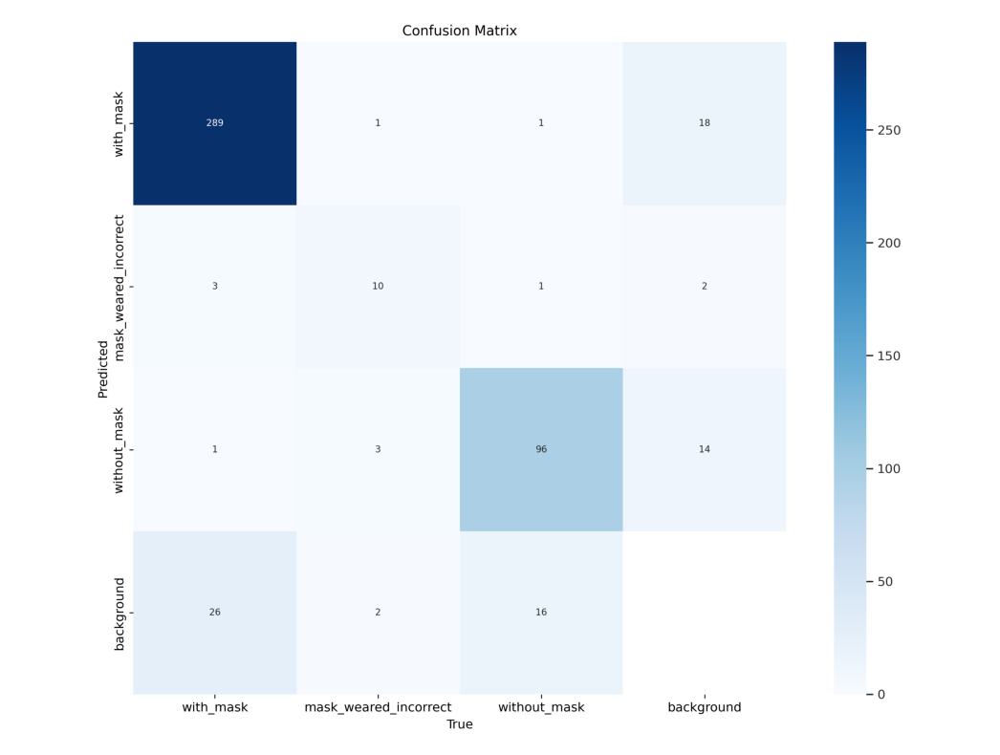

In [ ]:
confusion_matrix = Image.open("/content/drive/MyDrive/CS331/Final_project/yolov8/runs/detect/train/confusion_matrix.png")
plt.figure(figsize=(20,10))
plt.imshow(confusion_matrix)
plt.axis(False)
plt.show()

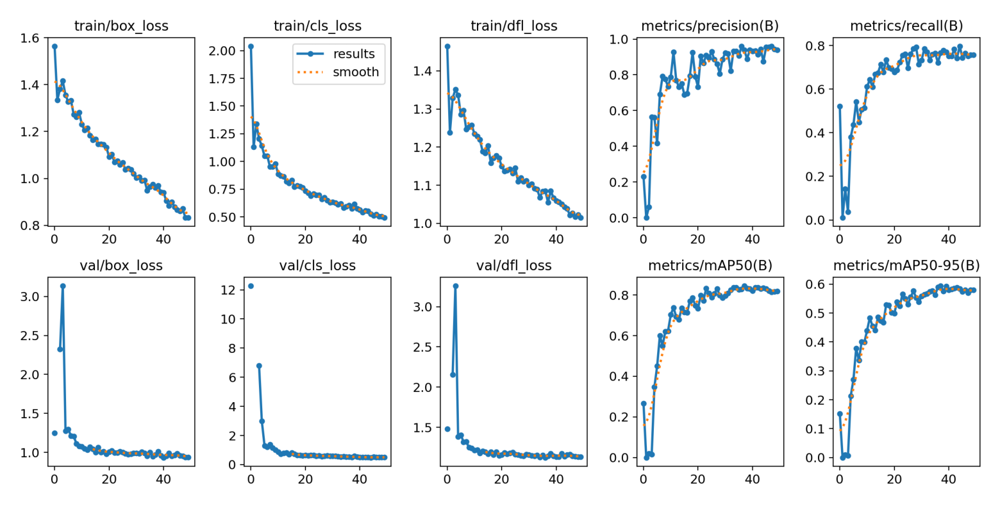

In [ ]:
rs= Image.open("/content/drive/MyDrive/CS331/Final_project/yolov8x/runs/detect/train/results.png")
plt.figure(figsize=(20,10))
plt.imshow(rs)
plt.axis(False)
plt.show()

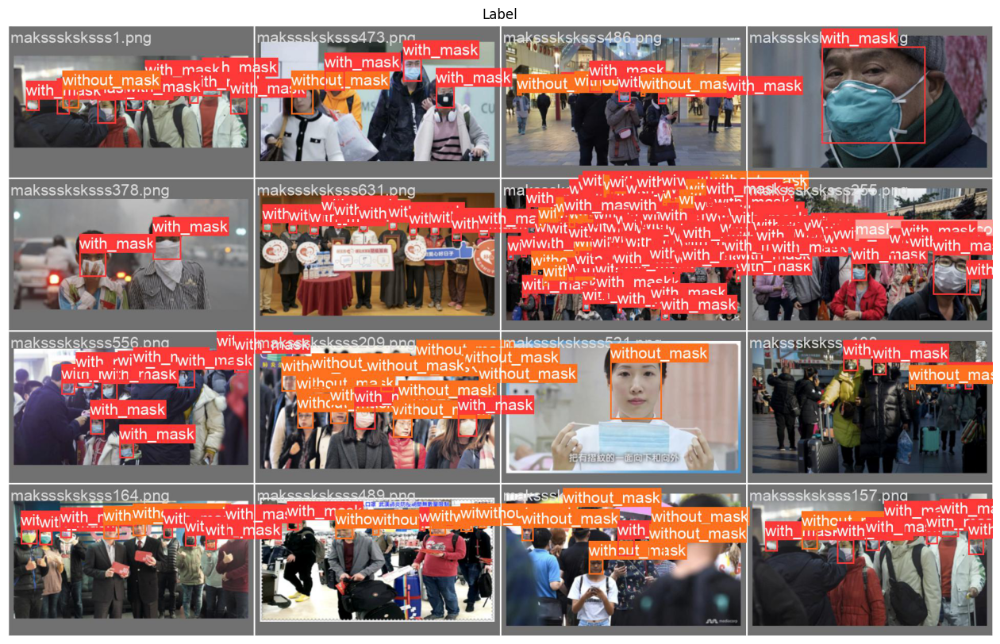

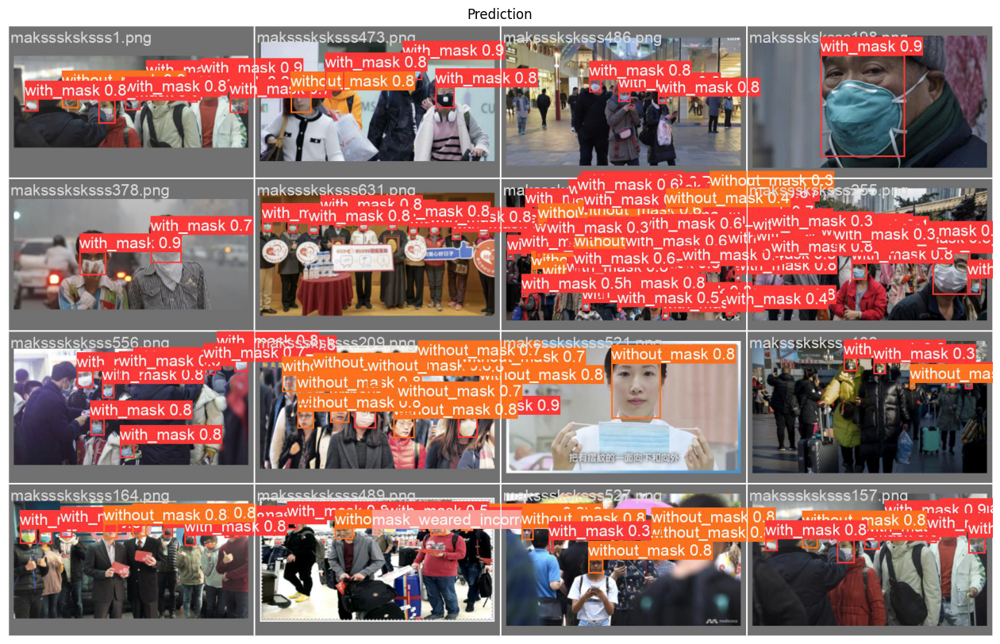

In [ ]:
val_label = Image.open("/content/drive/MyDrive/CS331/Final_project/yolov8x/runs/detect/train/val_batch0_labels.jpg")
val_pred = Image.open("/content/drive/MyDrive/CS331/Final_project/yolov8x/runs/detect/train/val_batch0_pred.jpg")

plt.figure(figsize=(20,10))
plt.imshow(val_label)
plt.title("Label")
plt.axis(False)
plt.show()

plt.figure(figsize=(20,10))
plt.imshow(val_pred)
plt.title("Prediction")
plt.axis(False)
plt.show()

# Predict

In [ ]:
%cd /content/drive/MyDrive/CS331/Final_project/yolov8x

/content/drive/MyDrive/CS331/Final_project/yolov8x


In [ ]:
# Load model
model = YOLO(model="/content/runs/detect/train5/weights/best.pt")


0: 416x640 1 with_mask, 3 without_masks, 89.9ms
Speed: 2.4ms preprocess, 89.9ms inference, 7.8ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/detect/predict2


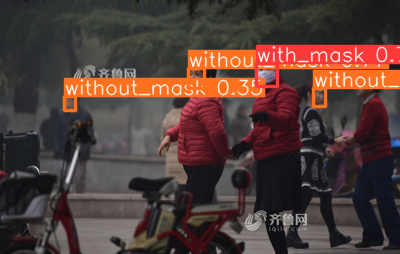

In [ ]:
from numpy import random
test_path = "/content/drive/MyDrive/CS331/Final_project/yolov8x/test"
filenames = glob.glob(test_path+"/*.png", recursive=False)
len_filenames = len(filenames)
test_image = cv2.imread(filenames[random.randint(len_filenames)])
# test_image2 = cv2.imread(filenames[1])

results = model.predict(test_image, save=True, line_width=1)
res_plotted = results[0].plot()

# res_plotted = cv2.cvtColor(res_plotted, cv2.COLOR_BGR2RGB)
cv2_imshow(res_plotted)

In [ ]:
def show_img_pred_in_test(line_width = 1):
  test_path = "/content/drive/MyDrive/CS331/Final_project/yolov8x/test"
  filenames = glob.glob(test_path+"/*.png", recursive=False)
  len_filenames = len(filenames)
  test_image_path = filenames[random.randint(len_filenames)]
  test_image = cv2.imread(test_image_path)

  # Đọc label
  fl = open(test_path +'/'+ os.path.basename(test_image_path).split('.')[0] +".txt", 'r')
  data = fl.readlines()
  fl.close()

  # Draw bounding box
  Height, Width = test_image.shape[:2]

  for dt in data:
      cls, x, y, w, h = map(float, dt.split(' '))
      # box_voc = BoundingBox.convert_bbox((x,y,w,h), from_type="yolo", to_type="voc", image_size=(W,H))
      xmin = int((x - w / 2)*Width)
      ymin = int((y - h / 2)*Height)
      xmax = int((x + w / 2)*Width)
      ymax = int((y + h / 2)*Height)

      if cls == 0:
        color = (0, 255, 0)
        class_name = 'with_mask'
      elif cls == 1:
        color = (0, 255, 255)
        class_name = 'mask_weared_incorrect'
      else:
        color = (0, 0, 255)
        class_name = 'without_mask'

      rec = cv2.rectangle(test_image, (xmin, ymin), (xmax, ymax), color, 2)
      cv2.putText(test_image, class_name, (xmin, ymin-10), cv2.FONT_HERSHEY_SIMPLEX,0.5, color, 1, cv2.LINE_AA)
  test_image = cv2.cvtColor(test_image, cv2.COLOR_RGB2BGR)
  # Predict
  test_img = cv2.imread(test_image_path)
  results = model.predict(test_img, save=True, line_width=line_width)
  res_plotted = results[0].plot()

  # test_img = cv2.cvtColor(test_img, cv2.COLOR_RGB2BGR)
  res_plotted = cv2.cvtColor(res_plotted, cv2.COLOR_RGB2BGR)
  # create figure
  fig = plt.figure(figsize=(10, 7))

  # setting values to rows and column variables
  rows = 2
  columns = 2

  # Adds a subplot at the 1st position
  fig.add_subplot(rows, columns, 1)

  # showing image
  plt.imshow(test_image)
  plt.axis('off')
  plt.title("True")

  # Adds a subplot at the 2nd position
  fig.add_subplot(rows, columns, 2)

  # showing image
  plt.imshow(res_plotted)
  plt.axis('off')
  plt.title("Prediction")


0: 384x640 2 with_masks, 74.8ms
Speed: 3.6ms preprocess, 74.8ms inference, 9.3ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/detect/predict2


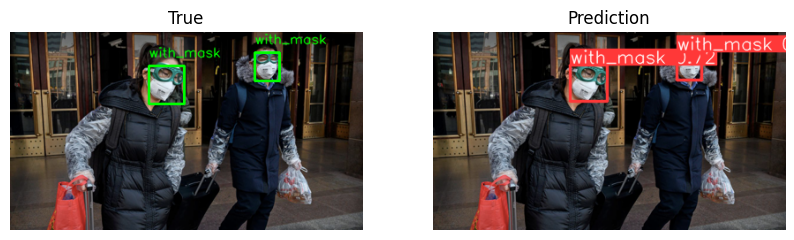

In [ ]:
show_img_pred_in_test()


0: 320x640 2 with_masks, 1 without_mask, 60.6ms
Speed: 3.2ms preprocess, 60.6ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/detect/predict2


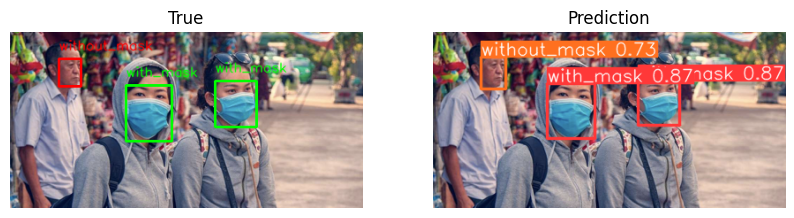

In [ ]:
show_img_pred_in_test()


0: 384x640 1 with_mask, 63.8ms
Speed: 1.7ms preprocess, 63.8ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/detect/predict2


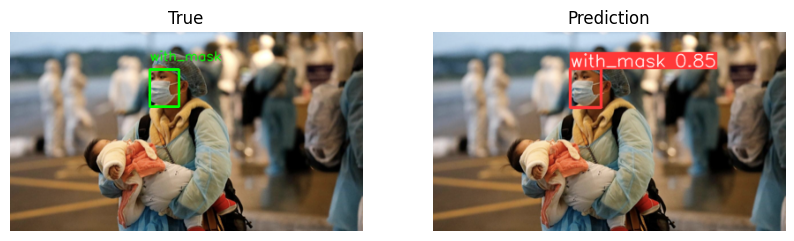

In [ ]:
show_img_pred_in_test()

In [ ]:
def show_pred(path, line_width=1):
  test_img = cv2.imread(path)

  results = model.predict(test_img, save=True, line_width=line_width)
  res_plotted = results[0].plot()

  test_img = cv2.cvtColor(test_img, cv2.COLOR_RGB2BGR)
  res_plotted = cv2.cvtColor(res_plotted, cv2.COLOR_RGB2BGR)
  # create figure
  fig = plt.figure(figsize=(10, 7))

  # setting values to rows and column variables
  rows = 2
  columns = 2

  # Adds a subplot at the 1st position
  fig.add_subplot(rows, columns, 1)

  # showing image
  plt.imshow(test_img)
  plt.axis('off')
  plt.title("Image")

  # Adds a subplot at the 2nd position
  fig.add_subplot(rows, columns, 2)

  # showing image
  plt.imshow(res_plotted)
  plt.axis('off')
  plt.title("Prediction")

In [ ]:
from google.colab.patches import cv2_imshow
def show_pred(path, line_width=1):
  test_img = cv2.imread(path)

  results = model.predict(test_img, save=True, line_width=line_width)
  res_plotted = results[0].plot()

  test_img = cv2.cvtColor(test_img, cv2.COLOR_RGB2BGR)
  res_plotted = cv2.cvtColor(res_plotted, cv2.COLOR_RGB2BGR)
  # create figure
  fig = plt.figure(figsize=(10, 7))

  # setting values to rows and column variables
  rows = 2
  columns = 2

  # Adds a subplot at the 1st position
  fig.add_subplot(rows, columns, 1)

  # showing image
  plt.imshow(test_img)
  plt.axis('off')
  plt.title("Image")

  # Adds a subplot at the 2nd position
  fig.add_subplot(rows, columns, 2)

  # showing image
  plt.imshow(res_plotted)
  plt.axis('off')
  plt.title("Prediction")

  # plt.savefig('results.png')


0: 448x640 2 with_masks, 7 without_masks, 75.3ms
Speed: 3.6ms preprocess, 75.3ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/detect/predict2


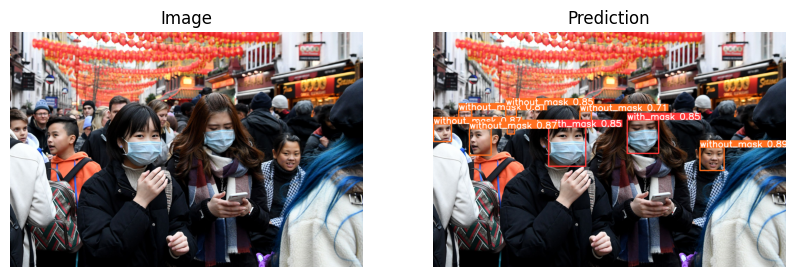

In [ ]:
show_pred('/content/drive/MyDrive/CS331/Final_project/image (19).jpg', 3)


0: 416x640 8 with_masks, 3 mask_weared_incorrects, 4 without_masks, 75.7ms
Speed: 2.7ms preprocess, 75.7ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/detect/predict2


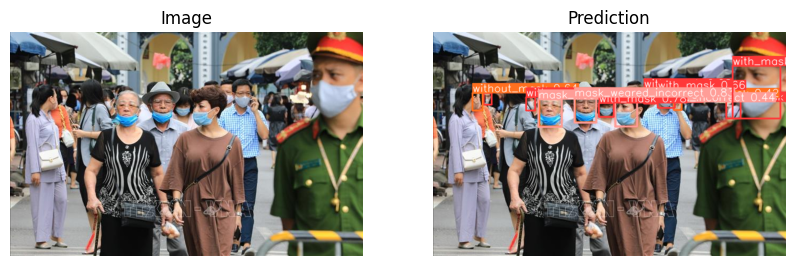

In [ ]:
show_pred('/content/drive/MyDrive/CS331/Final_project/vna_potal_ha_noi_nguoi_dan_khong_deo_khau_trang_chen_chuc_le_phu_tay_ho_giua_luc_dich_covid-19_dien_bien_phuc_tap_162124243_stand.jpg')


0: 448x640 2 with_masks, 1 mask_weared_incorrect, 1 without_mask, 71.7ms
Speed: 2.9ms preprocess, 71.7ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/detect/predict3


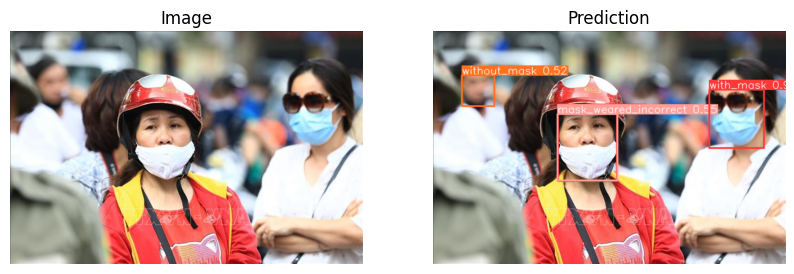

In [ ]:
show_pred('/content/drive/MyDrive/CS331/Final_project/vna_potal_ha_noi_nhieu_phu_huynh_hoc_sinh_thi_tot_nghiep_thpt_van_chu_quan_trong_phong_dich_covid-19_212228606_stand.jpg')


0: 448x640 1 with_mask, 1 mask_weared_incorrect, 1 without_mask, 72.2ms
Speed: 2.9ms preprocess, 72.2ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/detect/predict3


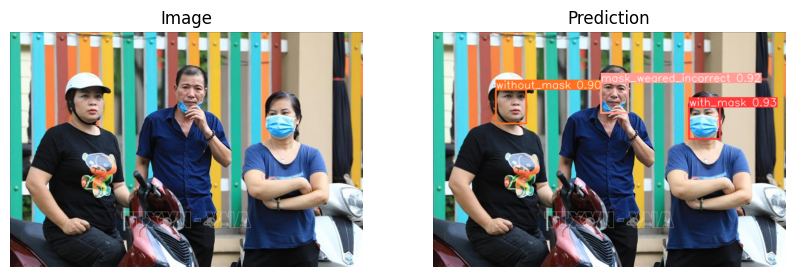

In [ ]:
show_pred('/content/drive/MyDrive/CS331/Final_project/vna_potal_ha_noi_nhieu_phu_huynh_hoc_sinh_thi_tot_nghiep_thpt_van_chu_quan_trong_phong_dich_covid-19_212227434_stand.jpg', 2)


0: 416x640 2 with_masks, 1 mask_weared_incorrect, 71.0ms
Speed: 2.9ms preprocess, 71.0ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/detect/predict3


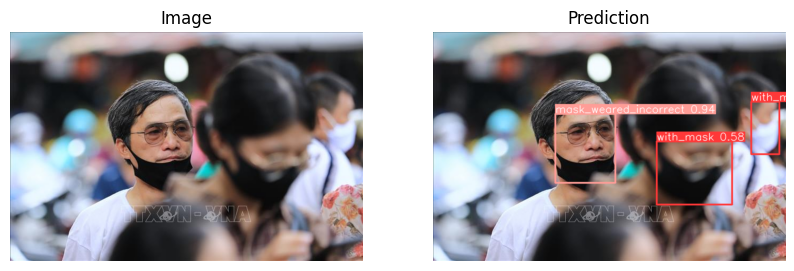

In [ ]:
show_pred('/content/drive/MyDrive/CS331/Final_project/vna_potal_ha_noi_nhieu_phu_huynh_hoc_sinh_thi_tot_nghiep_thpt_van_chu_quan_trong_phong_dich_covid-19_212230667_stand.jpg',2)


0: 352x640 9 with_masks, 1 mask_weared_incorrect, 2 without_masks, 62.6ms
Speed: 2.5ms preprocess, 62.6ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/detect/predict3


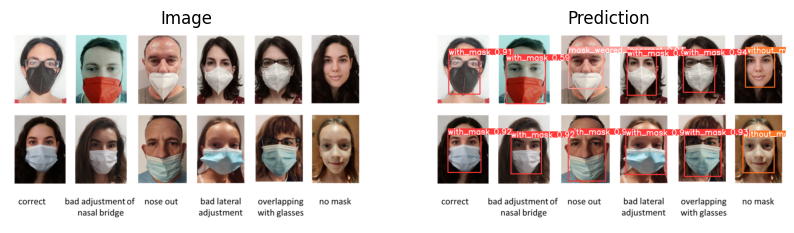

In [ ]:
show_pred('/content/drive/MyDrive/CS331/Final_project/test1.png', 4)


0: 416x640 2 with_masks, 1 mask_weared_incorrect, 70.9ms
Speed: 2.1ms preprocess, 70.9ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/detect/predict3


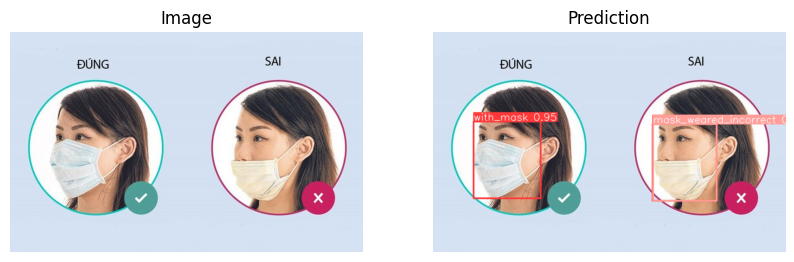

In [ ]:
show_pred('/content/drive/MyDrive/CS331/Final_project/Image test/image (9).jpg', 2)


0: 352x640 2 with_masks, 71.7ms
Speed: 1.6ms preprocess, 71.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/detect/predict9


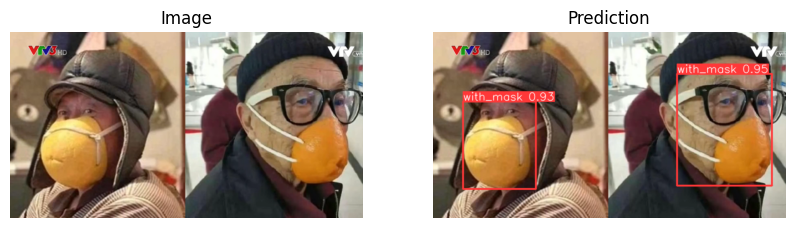

In [ ]:
show_pred('/content/9ik-1586413060742974437075.webp')


0: 576x640 2 with_masks, 104.1ms
Speed: 6.1ms preprocess, 104.1ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/detect/predict9


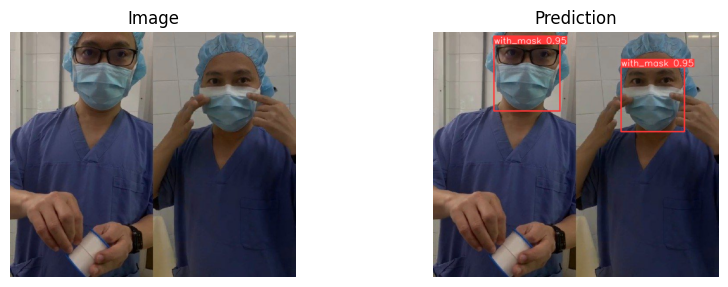

In [ ]:
show_pred('/content/cach-giup-mat-kinh-khong-bi-hoi-nuoc-khi-deo-khau-trang-y-te-202002081601044757.jpg')

In [ ]:
model.predict("/content/video2.mp4", save=True, imgsz=640, conf=0.5)



    WARNING ⚠️ stream/video/webcam/dir predict source will accumulate results in RAM unless `stream=True` is passed,
    causing potential out-of-memory errors for large sources or long-running streams/videos.

    Usage:
        results = model(source=..., stream=True)  # generator of Results objects
        for r in results:
            boxes = r.boxes  # Boxes object for bbox outputs
            masks = r.masks  # Masks object for segment masks outputs
            probs = r.probs  # Class probabilities for classification outputs

video 1/1 (1/648) /content/video2.mp4: 640x384 1 without_mask, 71.7ms
video 1/1 (2/648) /content/video2.mp4: 640x384 1 without_mask, 61.9ms
video 1/1 (3/648) /content/video2.mp4: 640x384 1 without_mask, 44.9ms
video 1/1 (4/648) /content/video2.mp4: 640x384 1 without_mask, 40.7ms
video 1/1 (5/648) /content/video2.mp4: 640x384 1 without_mask, 40.9ms
video 1/1 (6/648) /content/video2.mp4: 640x384 1 without_mask, 40.7ms
video 1/1 (7/648) /content/video2.mp4: 

[ultralytics.yolo.engine.results.Results object with attributes:
 
 boxes: ultralytics.yolo.engine.results.Boxes object
 keypoints: None
 keys: ['boxes']
 masks: None
 names: {0: 'with_mask', 1: 'mask_weared_incorrect', 2: 'without_mask'}
 orig_img: array([[[116,  90,  31],
         [116,  90,  31],
         [116,  90,  31],
         ...,
         [122,  88,  31],
         [122,  88,  31],
         [122,  88,  31]],
 
        [[112,  86,  27],
         [112,  86,  27],
         [112,  86,  27],
         ...,
         [115,  81,  24],
         [115,  81,  24],
         [115,  81,  24]],
 
        [[130,  85,   8],
         [130,  85,   8],
         [130,  85,   8],
         ...,
         [130,  83,   6],
         [130,  83,   6],
         [130,  83,   6]],
 
        ...,
 
        [[129,  87,   8],
         [129,  87,   8],
         [129,  87,   8],
         ...,
         [129,  87,   8],
         [129,  87,   8],
         [129,  87,   8]],
 
        [[129,  87,   8],
         [129,  87